<a href="https://colab.research.google.com/github/Mubashiruddin/Computer-vision/blob/main/Computer_vision_practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Computer Vision Masterclass - Face detection

### **Loading the image**

In [1]:
import cv2

In [28]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
image = cv2.imread('/content/drive/MyDrive/people1.png')

In [5]:
image.shape

(1280, 1920, 3)

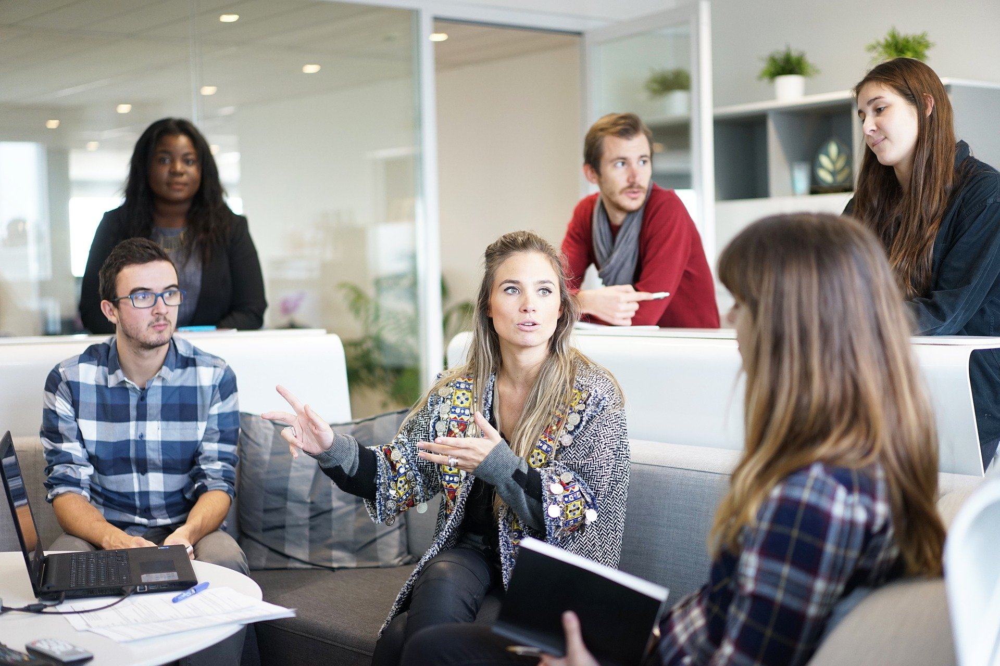

In [6]:
#cv2.imshow(image)
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [7]:
image = cv2.resize(image, (800, 600))
image.shape

(600, 800, 3)

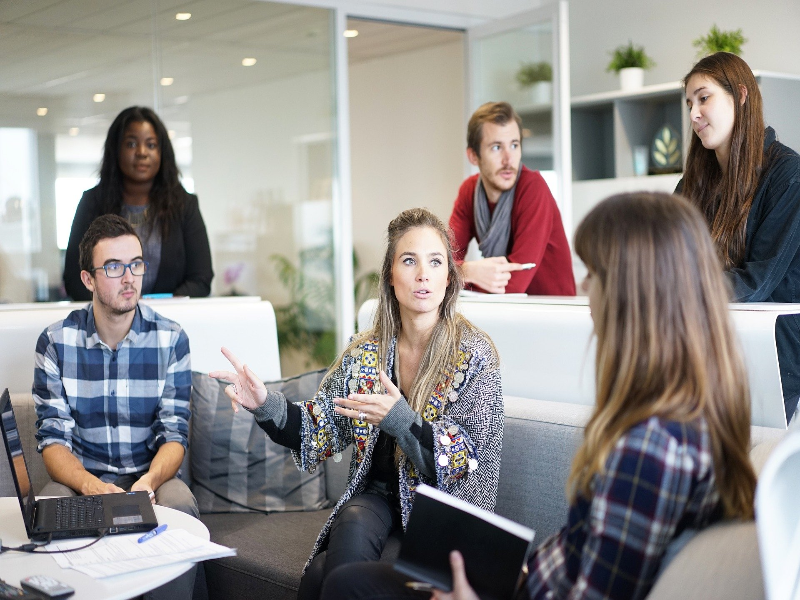

In [8]:
cv2_imshow(image)

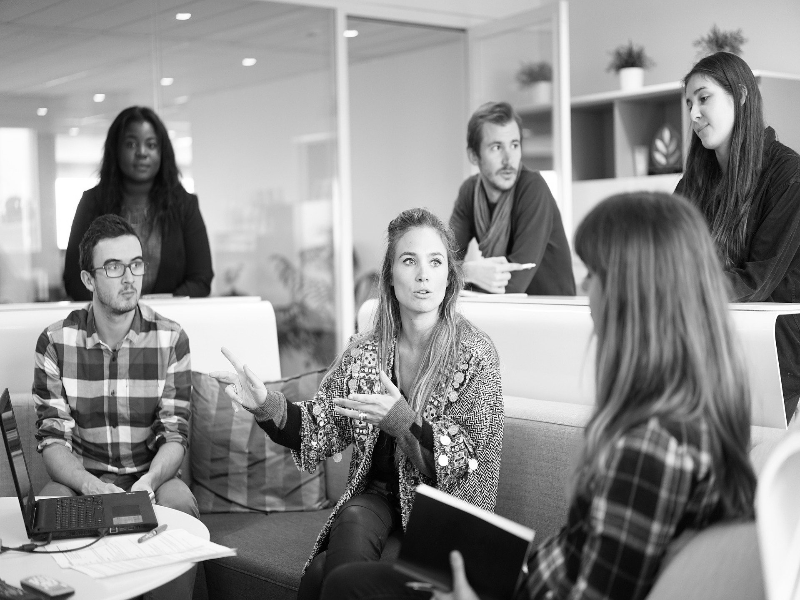

In [9]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [10]:
image.shape

(600, 800, 3)

In [11]:
image_gray.shape

(600, 800)

### **Detecting faces**

In [14]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/haarcascade_frontalface_default.xml')

In [15]:
detections = face_detector.detectMultiScale(image_gray)

In [16]:
detections
#here 677,72 shows the coordinates of x,y axis of first bounding box and 68,68 shows dimensions of the boudning box

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [17]:
len(detections)

6

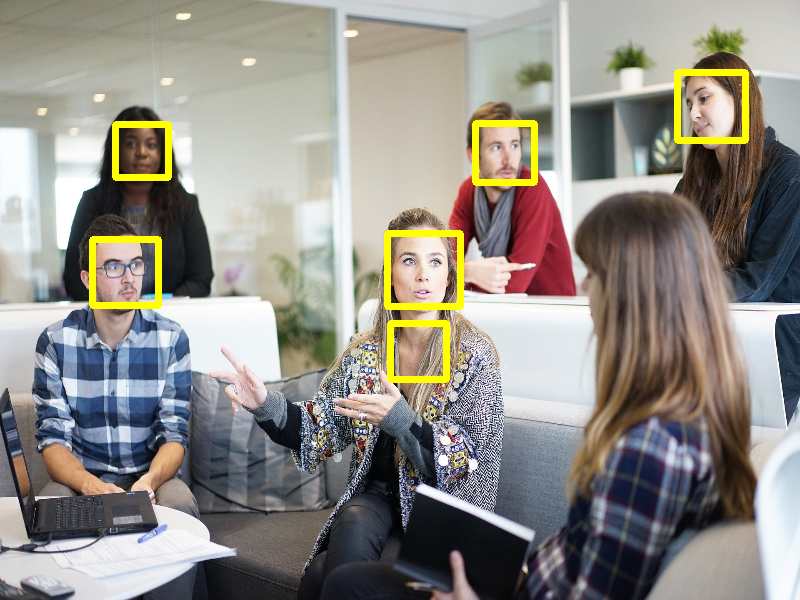

In [18]:
for (x, y, w, h) in detections:
  #print(x, y, w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,255), 5)
cv2_imshow(image)
#cv2.rectangle(image, first points of rectangle and last point of rectangle opp point , color of box , thickness of box outline)

## Haarcascade parameters

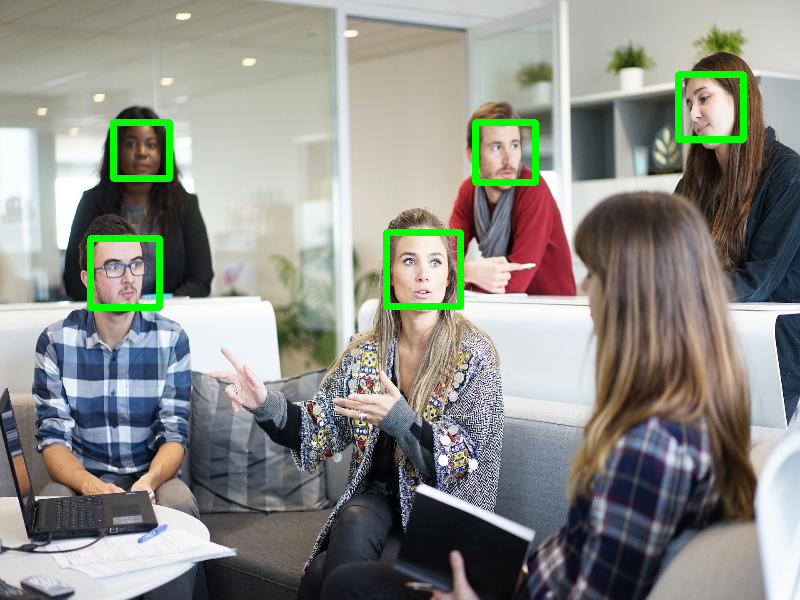

In [21]:
image = cv2.imread('/content/drive/MyDrive/people1.png')
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 5)
cv2_imshow(image)
#the lower the value of scale factor , the algorithm reduces size of image and tries to detect more faces or to detect smaller faces , inthis case we get more false positives
# so we take a relatively big value of scaleFactor
#test value of scalefactor by setting it to different values and which value gives best detections
#the larger the faces , the greater the scale value


46 46
45 45
48 48
49 49
51 51
51 51
45 45
43 43
49 49
51 51
47 47
28 28


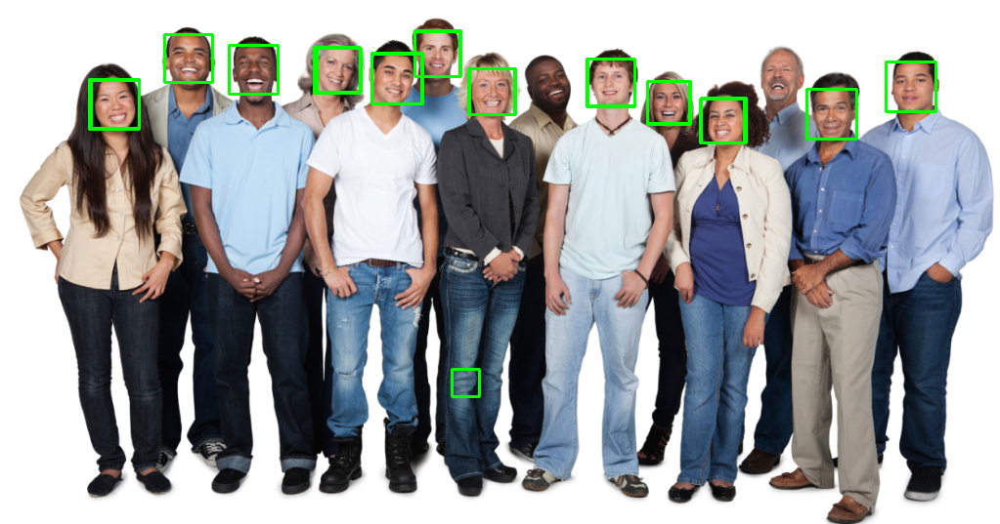

In [22]:
image = cv2.imread('/content/drive/MyDrive/people2.png')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.2, minNeighbors=5,
                                            minSize=(20,20), maxSize=(100,100))
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)
#minNeighbors indicates the number of candidate rectangles/bounding boxes that must exist in order to generate the best bounding box for a face
# we can tinker the value of minNeighbors to get all face detections
#higher the value of minNeighbors more the number of detections , however false positives might creep in
#so we need to choose more detections or more quality

## Eye detection

In [24]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/haarcascade_eye.xml')

(1280, 1920, 3)
38 38
37 37
24 24
25 25
36 36
43 43
39 39
24 24
26 26


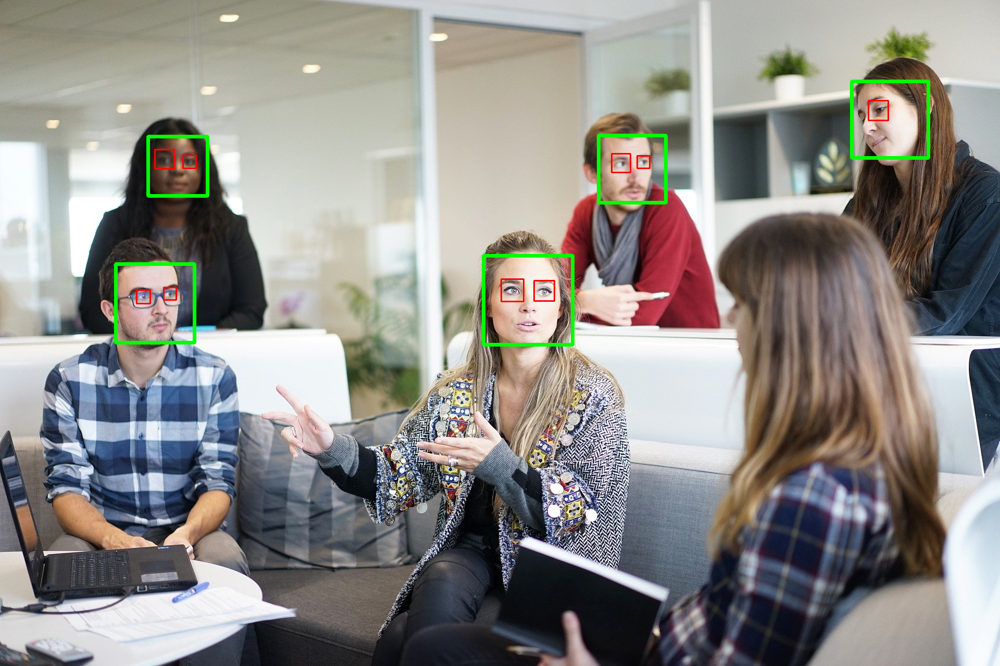

In [25]:
image = cv2.imread('/content/drive/MyDrive/people1.png')
#image = cv2.resize(image, (800, 600))
print(image.shape)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize = (30,30))
for (x, y, w, h) in face_detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 5)

eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1, minNeighbors=10, maxSize=(70,70))
for (x, y, w, h) in eye_detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,0,255), 2)

cv2_imshow(image)
#if scale factor value is less than 1.1 which is default , we tend to recognize more objects but the quality of detection is reduced.

## Other Objects

# cars

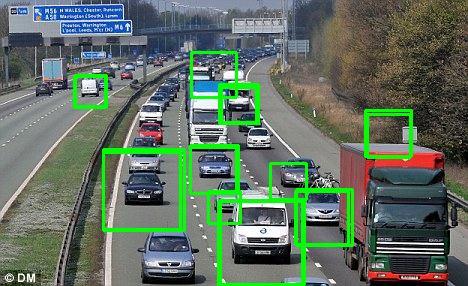

In [27]:
car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/cars.xml')
image = cv2.imread('/content/drive/MyDrive/cars.png')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = car_detector.detectMultiScale(image_gray, scaleFactor = 1.03, minNeighbors=5)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

# Full body

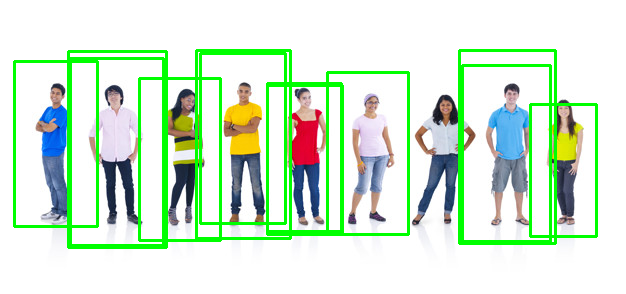

In [29]:
full_detector = cv2.CascadeClassifier('/content/drive/MyDrive/haarcascade_fullbody.xml')
image = cv2.imread('/content/drive/MyDrive/people3.png')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = full_detector.detectMultiScale(image_gray, scaleFactor = 1.05, minNeighbors=5,
                                              minSize = (50,50))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)